# Setup

Import packages at the setup section

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
from shutil import copy
from shutil import copytree, rmtree

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.layers import Dense, Dropout,GlobalAveragePooling2D,BatchNormalization, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing import image
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras import regularizers
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.models import load_model

from sklearn.metrics import classification_report, roc_auc_score, roc_curve, auc, accuracy_score, precision_score, recall_score, f1_score
from sklearn.preprocessing import label_binarize

from platform import python_version
from IPython.display import clear_output

from collections import defaultdict

# Dataset Download

In [5]:
def get_data():
  if "food-101" in os.listdir():
    print("Dataset already exists")
  else:
    tf.keras.utils.get_file(
    'food-101.tar.gz',
    'http://data.vision.ee.ethz.ch/cvl/food-101.tar.gz',
    cache_subdir='/content',
    extract=True,
    archive_format='tar',
    cache_dir=None
    )
    print("Dataset downloaded and extracted successfully!")

def prepare_data(filepath, src, dest):
  classes_images = defaultdict(list)
  with open(filepath, 'r') as txt:
      paths = [read.strip() for read in txt.readlines()]
      for p in paths:
        food = p.split('/')
        classes_images[food[0]].append(food[1] + '.jpg')

  for food in classes_images.keys():
    #print("\nCopying images into ",food)
    if not os.path.exists(os.path.join(dest,food)):
      os.makedirs(os.path.join(dest,food))
    for i in classes_images[food]:
      copy(os.path.join(src,food,i), os.path.join(dest,food,i))
  print("Copying Done!")

In [ ]:
get_data()

print("Creating train data...")
prepare_data('food-101/meta/train.txt', 'food-101/images', 'food-101/train')
print("Creating test data...")
prepare_data('food-101/meta/test.txt', 'food-101/images', 'food-101/test')

# Preprocessing

In [4]:
# The number of images that will be processed together in one batch during training. A batch size of 128 is a common choice, balancing the trade-off between computational efficiency and gradient estimation accuracy.
batch_size = 128

# The number of color channels in each image. A value of 3 typically represents RGB images, where each pixel has three values corresponding to red, green, and blue.
channels = 3

#The number of classes that the model is expected to classify the images into. Food101 contains 101 classes of food images.
num_classes = 101

height = 224
width = 224
# Resize images to be 224x224 pixels
img_size = (height, width) 

In [5]:
## Build an ImageDataGenerator instance for data Augmentation
train_datagen = ImageDataGenerator(
        rotation_range=40, # The image will be randomly rotated between -40 to +40 degrees.
        width_shift_range=0.2, # The image can be shifted horizontally by up to 20% of its width.
        height_shift_range=0.2, # The image can be shifted vertically by up to 20% of its height.
        rescale=1. / 255, # The pixel values are rescaled to the range [0, 1] by dividing them by 255.
        shear_range=0.2, # The shearing angle can be between -0.2 to +0.2 radians.
        zoom_range=0.2, #  The image can be zoomed in or out by up to 20%.
        horizontal_flip=True, # Allows the images to be randomly flipped horizontally. 
        fill_mode='nearest') # The empty spaces will be filled with the nearest pixel values.

<code>ImageDataGenerator</code> from the Keras library is used to augment and preprocess image data before feeding it into a neural network.
- <code>rotation_range</code>: The range within which the image can be randomly rotated. 
- <code>width_shift_range</code>: The range for horizontal shift of the image. 
- <code>height_shift_range</code>: Similar to <code>width_shift_range</code>. 
- <code>rescale</code>: Scale the pixel values. 
- <code>shear_range</code>: Shear transformations where the image is distorted along one axis. 
- <code>zoom_range</code>: The range within which the image can be randomly zoomed.
- <code>horizontal_flip</code>: Set the condition to allow the images to be randomly flipped horizontally. 
- <code>fill_mode</code>: Some parts of the image may end up being empty. The fill_mode parameter determines how to fill these empty spaces.


In [6]:
test_datagen = ImageDataGenerator(rescale=1. / 255)

train_data_dir = 'food-101/train'
validation_data_dir = 'food-101/test'

train_data = train_datagen.flow_from_directory(
    train_data_dir,
    target_size = img_size,
    batch_size = batch_size,
    class_mode = 'categorical')

val_data = test_datagen.flow_from_directory(
    validation_data_dir,
    target_size = img_size,
    batch_size = batch_size,
    class_mode='categorical')

Found 75750 images belonging to 101 classes.
Found 25250 images belonging to 101 classes.


This code preprocess and load image data from specified directories for training and validation.

# Training

## Inception V3 training

- freeze the top 249 layers so that their weights won't be updated during training. The learned features from the original dataset are preserved.
- added GlobalAveragePooling2D, two dense layer and a dropout layer on top of other layers
- SGD optimizer with larning rate of 0.001
- early stop based on loss rate

In [10]:
# InceptionV3 is a pretrained model architecture. 
# The model is initialized with weights that have been pre-trained on the ImageNet dataset and not inclue the fully connected layer at the top of the network.
inceptionV3_tune = InceptionV3(weights='imagenet', include_top=False)

#freeze the top 249 layers and unfreeze the other layers
for layer in inceptionV3_tune.layers[:249]:
    layer.trainable = False
for layer in inceptionV3_tune.layers[249:]:
    layer.trainable = True

x = inceptionV3_tune.output
x = GlobalAveragePooling2D()(x) # Reduces the spatial dimensions of the input, computing the average value for each feature map.
x = Dense(2048, activation='relu') (x) # Two fully connected layers each with 2048 units and ReLU activation function.
x = Dense(2048, activation='relu')(x) # Two fully connected layers each with 2048 units and ReLU activation function.
x = Dropout(0.2)(x) # Prevent overfitting by randomly setting 20% of the input units to 0 during training.

# The final layer is a fully connected layer with 101 output units and applies L2 regularization to the weights. 
#In addition, the softmax activation function is used to converts the raw output into probabilities.
predictions = Dense(num_classes, kernel_regularizer=regularizers.l2(0.005), activation='softmax')(x)
model = Model(inputs = inceptionV3_tune.input, outputs = predictions)

# The model use Stochastic Gradient Descent (SGD) as optimizer. 
# For loss function used during training, it uses categorical crossentropy which is commonly used for multi-class classification problems
model.compile(optimizer = SGD(learning_rate=0.001, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])

# Create an instance of the ModelCheckpoint callback which is used to save the model at different points during training.
checkpointer1 = ModelCheckpoint(filepath='InceptionV3_model_5class_1.hdf5', verbose=1, save_best_only=True)

# Creates an instance of the EarlyStopping callback which is used to stop the training process early if the validation loss does not improve for 5 consecutive epochs
stop_early = EarlyStopping(monitor='val_loss', patience=5)

history_inceptionV3 = model.fit(train_data,
                    validation_data = val_data,
                    epochs = 100,
                    verbose = 1,
                    callbacks=[checkpointer1, stop_early])


Unfreeze the top 2 inception blocks
Epoch 1/100
592/592 [==============================] - ETA: 0s - loss: 4.9671 - accuracy: 0.1517
Epoch 1: val_loss improved from inf to 3.73425, saving model to InceptionV3_model_5class_1.hdf5
592/592 [==============================] - 1694s 3s/step - loss: 4.9671 - accuracy: 0.1517 - val_loss: 3.7342 - val_accuracy: 0.3673
Epoch 2/100
592/592 [==============================] - ETA: 0s - loss: 3.5412 - accuracy: 0.3600
Epoch 2: val_loss improved from 3.73425 to 2.77103, saving model to InceptionV3_model_5class_1.hdf5
592/592 [==============================] - 1370s 2s/step - loss: 3.5412 - accuracy: 0.3600 - val_loss: 2.7710 - val_accuracy: 0.5048
Epoch 3/100
592/592 [==============================] - ETA: 0s - loss: 2.9911 - accuracy: 0.4467
Epoch 3: val_loss improved from 2.77103 to 2.40645, saving model to InceptionV3_model_5class_1.hdf5
592/592 [==============================] - 1382s 2s/step - loss: 2.9911 - accuracy: 0.4467 - val_loss: 2.4064 -

Epoch 26/100
592/592 [==============================] - ETA: 0s - loss: 1.1053 - accuracy: 0.7393
Epoch 26: val_loss improved from 1.22721 to 1.22122, saving model to InceptionV3_model_5class_1.hdf5
592/592 [==============================] - 1798s 3s/step - loss: 1.1053 - accuracy: 0.7393 - val_loss: 1.2212 - val_accuracy: 0.7113
Epoch 27/100
592/592 [==============================] - ETA: 0s - loss: 1.0829 - accuracy: 0.7443
Epoch 27: val_loss improved from 1.22122 to 1.20842, saving model to InceptionV3_model_5class_1.hdf5
592/592 [==============================] - 1939s 3s/step - loss: 1.0829 - accuracy: 0.7443 - val_loss: 1.2084 - val_accuracy: 0.7125
Epoch 28/100
592/592 [==============================] - ETA: 0s - loss: 1.0531 - accuracy: 0.7507
Epoch 28: val_loss did not improve from 1.20842
592/592 [==============================] - 1914s 3s/step - loss: 1.0531 - accuracy: 0.7507 - val_loss: 1.2148 - val_accuracy: 0.7137
Epoch 29/100
592/592 [==============================] - E

A function developed in the early phrase to plot accuracy curve and loss curve based on trained models.

In [3]:
# Plot loss rate curve
def plotLoss(history_model):
    plt.xlabel('Epoch No.')
    plt.ylabel('Loss')
    plt.plot(history_model.history['loss'], label='training set')
    plt.plot(history_model.history['val_loss'], label='validation set')
    plt.legend()

# Plot accuracy rate curve
def plotAccuracy(history_model):
    plt.xlabel('Epoch No.')
    plt.ylabel('Accuracy')
    plt.plot(history_model.history['accuracy'], label='training set')
    plt.plot(history_model.history['val_accuracy'], label='validation set')
    plt.legend()

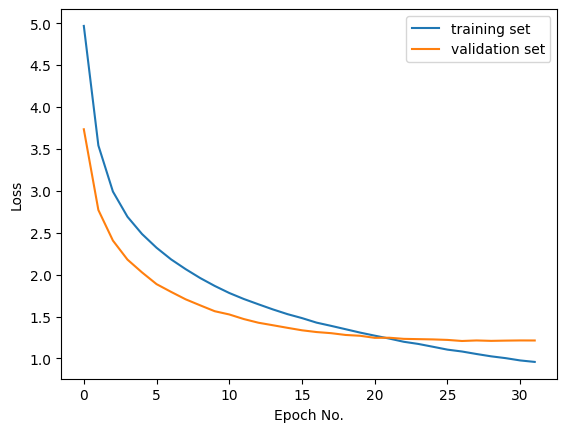

In [12]:
plotLoss(history_inceptionV3) 

The above graph plots the loss rate curve, it depicts how the loss of a model evolves over epochs during training and validation. The analysis of this graph:
1. As the epochs progress, the gap between training and validation loss narrows and converge at the 21st echpo. This suggests that the model isn't overfitting significantly in the initial and middle stages of training.
2. Towards the later epochs, both the training and validation losses begin to plateau. This suggests that the model has almost reached its optimal state
3. Yhe model is generalizing well to unseen data as the validation loss is relatively consistent with the training loss throughout. 

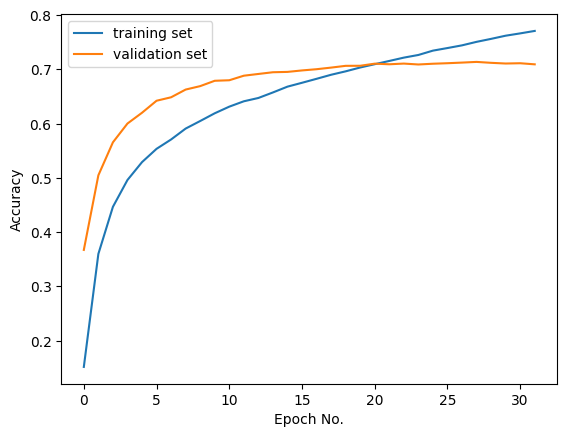

In [13]:
#Plot accuracy rate for both training set and validation set
plotAccuracy(history_inceptionV3) 

The above graph plots the accuracy rate curve, it depicts how the accuracy of a model evolves over epochs during training and validation. The analysis of this graph:
1. At the 21st epoch, the validation accuracy starts to plateau.
2. After the 21st epoch , the training accuracy is higher compared to the validation accuracy. This is an early sign of overfitting.
3. By the end of the epochs, the training accuracy is higher than the validation accuracy. While the training accuracy is approaching 80%, the validation accuracy seems to stabilize just above 70%.

For models training over 20 epoches, It is difficult to get a sense of the progress of training during the training. Therefore a function called PlotLearning is used in model training to plot train and test loss as well as train and test accuracy for every epoches. The Plot Learning is a Keras Callback that will be executed at different times during training:
 - when each epoch starts or ends
 - when each training batch starts or ends
 - when each validation batch starts or ends

In [5]:
class PlotLearning(tf.keras.callbacks.Callback):
    def on_train_begin(self, logs={}):
        self.metrics = {}
        for metric in logs:
            self.metrics[metric] = []
            

    def on_epoch_end(self, epoch, logs={}):
        for metric in logs:
            if metric in self.metrics:
                self.metrics[metric].append(logs.get(metric))
            else:
                self.metrics[metric] = [logs.get(metric)]
        
        metrics = [x for x in logs if 'val' not in x]
        
        f, axs = plt.subplots(1, len(metrics), figsize=(15,5))
        clear_output(wait=True)

        for i, metric in enumerate(metrics):
            axs[i].plot(range(1, epoch + 2), 
                        self.metrics[metric], 
                        label=metric)
            if logs['val_' + metric]:
                axs[i].plot(range(1, epoch + 2), 
                            self.metrics['val_' + metric], 
                            label='val_' + metric)   
            axs[i].legend()
            axs[i].grid()

        plt.tight_layout()
        plt.show()

## Fine-tune version 1

- freeze the top 249 layers
- added GlobalAveragePooling2D, two dense layer and a dropout layer on top of other layers
- Adam optimizer with larning rate of 0.0001 （previous: SGD optimizer with learning rate of 0.001）
- early stop based on loss rate

In comparision to SGD, Adam brings enhancements that offer several advantages over plain SGD:
- Combines advantages of other optimizers: Adam combines the benefits of two other popular optimization algorithms: AdaGrad and RMSProp
- In many empirical scenarios, Adam often converges faster and to better solutions than plain SGD.
- Adaptive learning 
- Less sensitive to hyperparameter choices


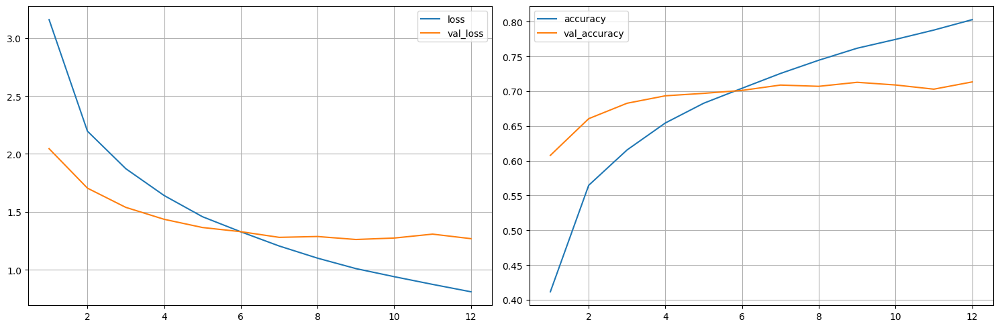


592/592 [==============================] - 1526s 3s/step - loss: 0.8109 - accuracy: 0.8030 - val_loss: 1.2691 - val_accuracy: 0.7134


In [11]:
inceptionV3_tune = InceptionV3(weights='imagenet', include_top=False)

for layer in inceptionV3_tune.layers[:249]:
    layer.trainable = False
for layer in inceptionV3_tune.layers[249:]:
    layer.trainable = True

x = inceptionV3_tune.output
x = GlobalAveragePooling2D()(x)
x = Dense(2048, activation='relu') (x)
x = Dense(2048, activation='relu')(x)
x = Dropout(0.2)(x)

predictions = Dense(num_classes, kernel_regularizer=regularizers.l2(0.005), activation='softmax')(x)

model = Model(inputs = inceptionV3_tune.input, outputs = predictions)

# The model use Adaptive Moment Estimation (Adam) as optimizer. 
# Reduce the learning rate from 0.001 to 0.0001. A smaller learning rate means smaller adjustments to weights, leading to potentially more stable (but slower) convergence.
model.compile(optimizer = Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

checkpointer1 = ModelCheckpoint(filepath='InceptionV3_model_full.hdf5', verbose=1, save_best_only=True)

# Creates an instance of the EarlyStopping callback which is used to stop the training process early if the validation loss does not improve for 3 consecutive epochs.
stop_early = EarlyStopping(monitor='val_loss', patience=3)

history_inceptionV3 = model.fit(train_data,
                    validation_data = val_data,
                    epochs = 100,
                    verbose = 1,
                    callbacks=[checkpointer1, stop_early,PlotLearning()])


A evaluation metric that output precision, recall, f1-score for each food class based on testing set. In addition, the function plots AUC-ROC graph for each food class.
The function takes two parameters:
  1. model_path: the path from current .ipynb file to .hdf5 files
  2. test_dir: the directory of test set

In [1]:

def evaluate_model(model_path, test_dir):
    # Load the model
    model = load_model(model_path)
    
    # Prepare the test data
    test_datagen = ImageDataGenerator(rescale=1./255)
    test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(224, 224),
        batch_size=32,
        class_mode='categorical',
        shuffle=False
    )
    
    # Get the true labels and predicted probabilities
    y_true = test_generator.classes
    y_true = label_binarize(y_true, classes=range(len(test_generator.class_indices)))
    y_pred = model.predict(test_generator, steps=len(test_generator), verbose=1)
    
    # Compute ROC curve and ROC area for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    n_classes = y_pred.shape[1]
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true[:, i], y_pred[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
        
    # Classification Report
    y_true_classes = np.argmax(y_true, axis=1)
    y_pred_classes = np.argmax(y_pred, axis=1)
    print("Classification Report:")
    report = classification_report(y_true_classes, y_pred_classes, target_names=test_generator.class_indices.keys())
    print(report)
    df = pandas.DataFrame(report).transpose()
    file_name = 'MarksData.xlsx'
 
    # saving the excel
    df.to_excel(file_name)
    print('DataFrame is written to Excel File successfully.')
    
    #Print AUC-ROC value for each class
    print("AUC-ROC values for each class:")
    for i, name in enumerate(test_generator.class_indices.keys()):
        print(f"AUC-ROC for {name}: {roc_auc[i]:.2f}")
        
    # Plot individual ROC curves
    for i, name in enumerate(test_generator.class_indices.keys()):
        plt.plot(fpr[i], tpr[i], label=f'{name} (area = {roc_auc[i]:.2f})')
    
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic Curve')
    plt.legend(loc="lower right")
    plt.show()

The evaluation of Inception V3 fine-tune version 1

model_path = 'InceptionV3_model_full.hdf5'
test_dir = 'food-101/test'
evaluate_model(model_path, test_dir)

## Fine-tune version 2: 

- unfreezed all all Inception V3 layers
- added GlobalAveragePooling2D, two dense layer and a dropout layer on top of other layers
- Adam optimizer with larning rate of 0.0001 
- early stop based on loss rate

The fine-rune focus on the performance of transfer learning on Food-101 dataset

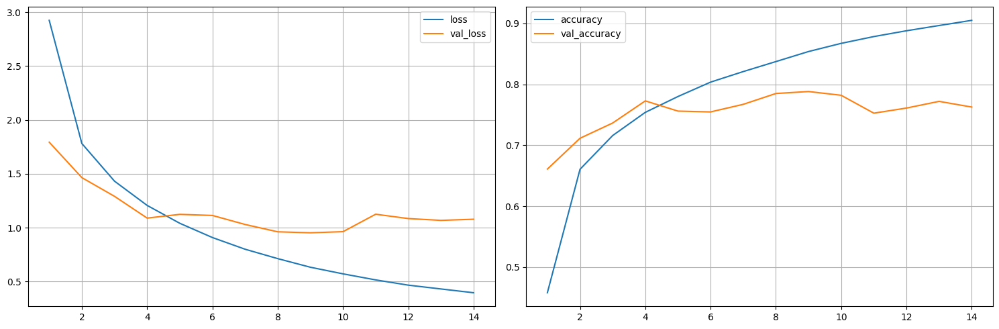


592/592 [==============================] - 4841s 8s/step - loss: 0.3963 - accuracy: 0.9051 - val_loss: 1.0782 - val_accuracy: 0.7628


In [10]:
inceptionV3_tune = InceptionV3(weights='imagenet', include_top=False)


x = inceptionV3_tune.output
x = GlobalAveragePooling2D()(x)
x = Dense(2048, activation='relu') (x)
x = Dense(2048, activation='relu')(x)
x = Dropout(0.2)(x)

predictions = Dense(num_classes, kernel_regularizer=regularizers.l2(0.005), activation='softmax')(x)

model = Model(inputs = inceptionV3_tune.input, outputs = predictions)
model.compile(optimizer = Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

checkpointer1 = ModelCheckpoint(filepath='InceptionV3_model_full_unfreezed.hdf5', verbose=1, save_best_only=True)

stop_early = EarlyStopping(monitor='val_loss', patience=5)

history_inceptionV3 = model.fit(train_data,
                    validation_data = val_data,
                    epochs = 100,
                    verbose = 1,
                    callbacks=[checkpointer1, stop_early,PlotLearning()])

The evaluation for Inception V3 fine-tune version 2：
1.  The validation loss decreases alongside the training loss initially but starts to plateau and even slightly increase towards the end. This could be an early sign of overfitting。
2.  The validation accuracy also appears to plateau and even slightly decline towards the last epochs, which again can be a sign of overfitting.

The evaluation metrics and the roc value are shown below

Found 25250 images belonging to 101 classes.
790/790 [==============================] - 350s 442ms/step
Classification Report:
                         precision    recall  f1-score   support

              apple_pie       0.57      0.67      0.61       250
         baby_back_ribs       0.86      0.81      0.83       250
                baklava       0.83      0.84      0.83       250
         beef_carpaccio       0.87      0.84      0.86       250
           beef_tartare       0.78      0.75      0.76       250
             beet_salad       0.65      0.71      0.68       250
               beignets       0.76      0.94      0.84       250
               bibimbap       0.86      0.92      0.89       250
          bread_pudding       0.77      0.38      0.51       250
      breakfast_burrito       0.82      0.64      0.72       250
             bruschetta       0.85      0.64      0.73       250
           caesar_salad       0.88      0.85      0.87       250
                cannoli    

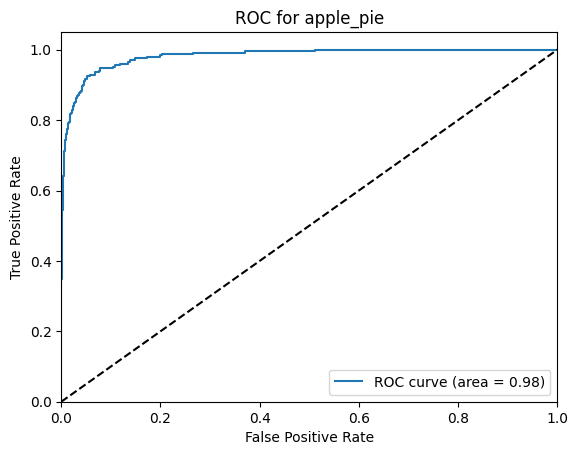

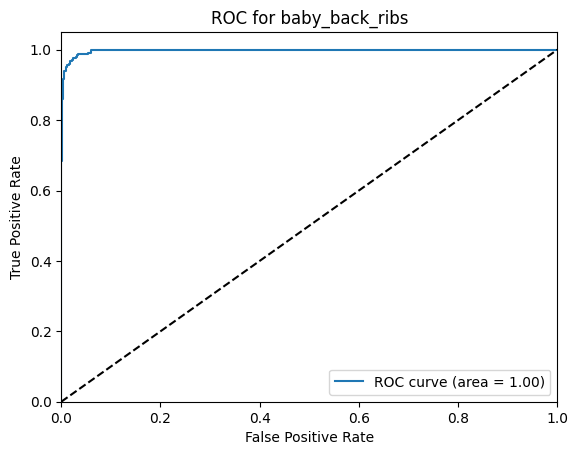

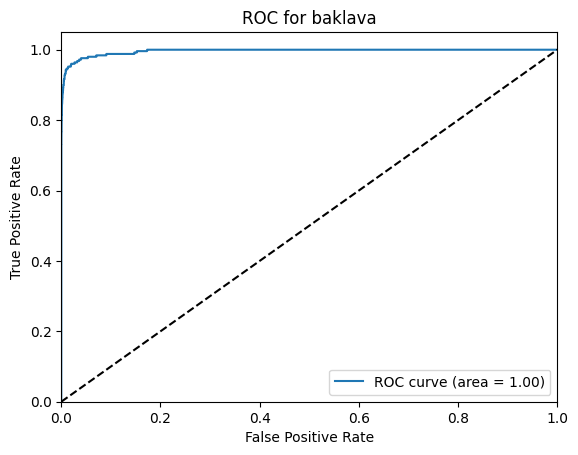

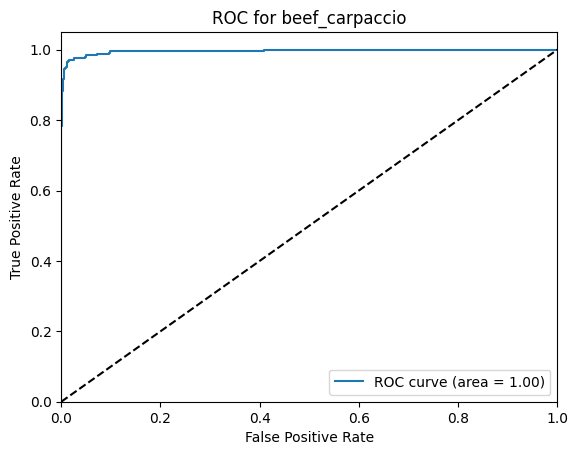

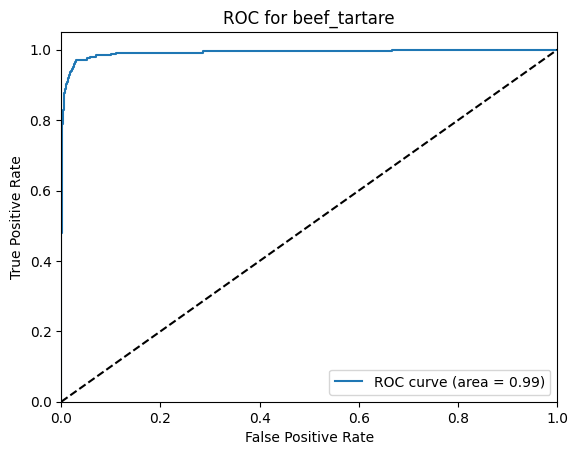

...

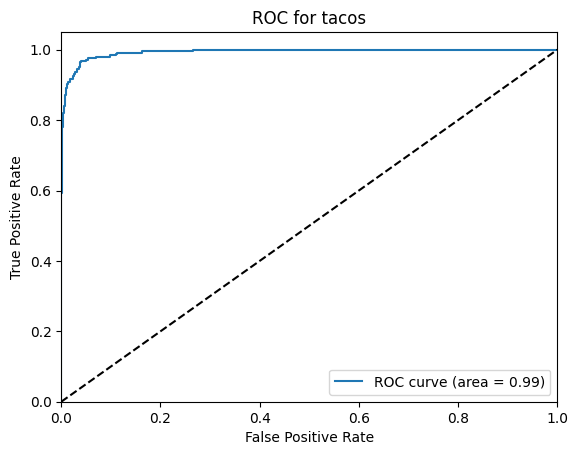

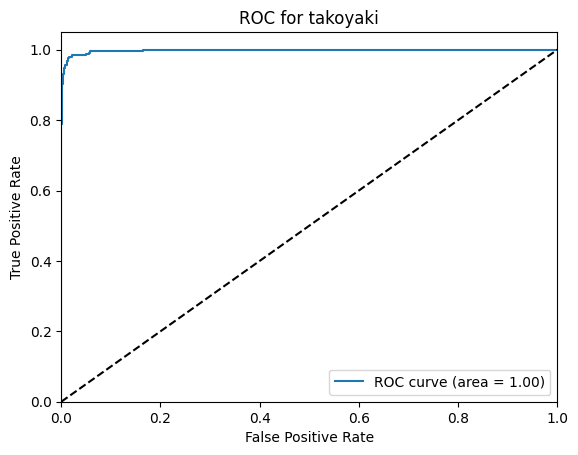

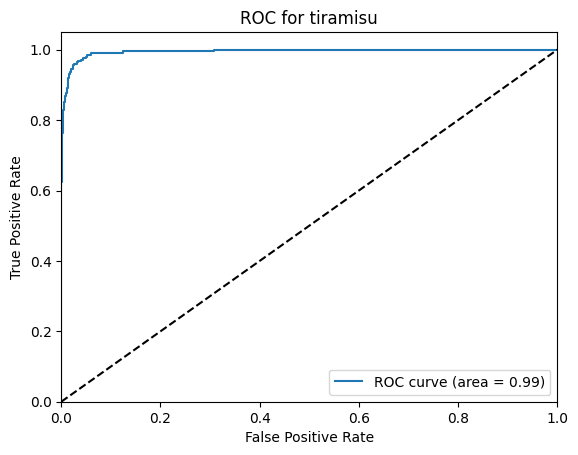

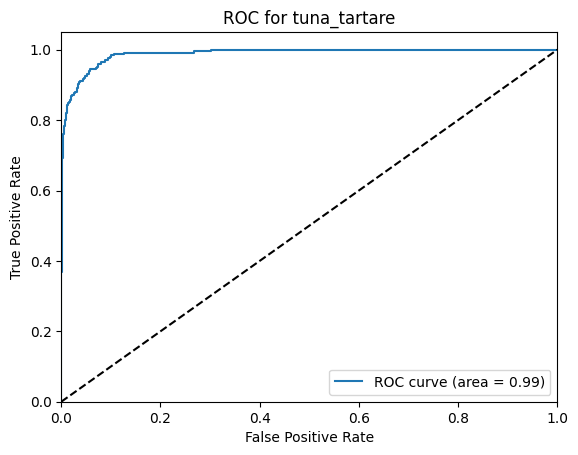

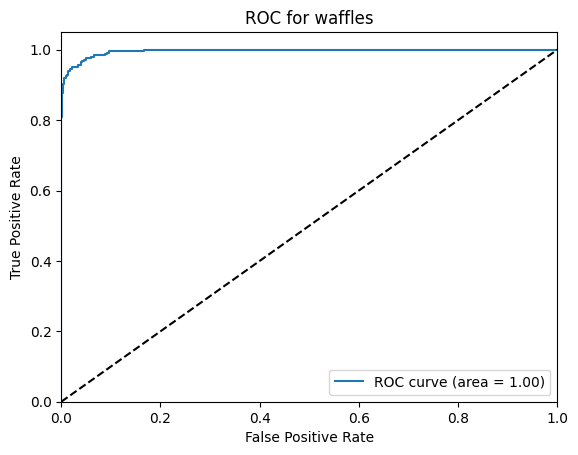

In [13]:
model_path = 'InceptionV3_model_full_unfreezed.hdf5'
test_dir = 'food-101/test'
evaluate_model(model_path, test_dir)

## Fine-tune version 3

- unfreezed all Inception V3 layers
- added GlobalAveragePooling2D, two dense layer and a dropout layer on top of other layers
- Adam optimizer with larning rate of 0.0001 
- early stop based on loss rate

The fine-rune focus on the performance of transfer learning on Food-101 dataset

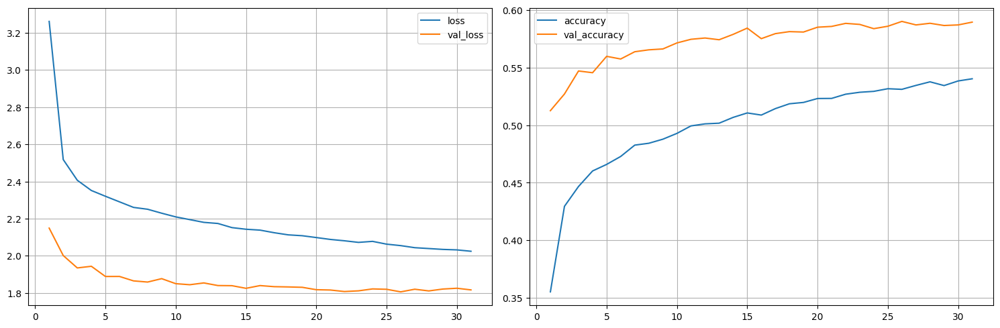

592/592 [==============================] - 1309s 2s/step - loss: 2.0246 - accuracy: 0.5403 - val_loss: 1.8167 - val_accuracy: 0.5895


In [10]:
inceptionV3_tune = InceptionV3(weights='imagenet', include_top=False,pooling='avg')

#ungreeze alll layers
for layer in inceptionV3_tune.layers:
    layer.trainable = False
    
x = inceptionV3_tune.output
x = BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001)(x) # Improve the speed, performance, and stability of artificial neural networks. It normalizes the input layer by re-centering and re-scaling.
x = Dropout(0.2)(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.2)(x)

predictions = Dense(num_classes, kernel_regularizer=regularizers.l2(0.005), activation='softmax')(x)

model = Model(inputs = inceptionV3_tune.input, outputs = predictions)
model.compile(optimizer = Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

checkpointer1 = ModelCheckpoint(filepath='InceptionV3_model_full_v3.hdf5', verbose=1, save_best_only=True)

stop_early = EarlyStopping(monitor='val_loss', patience=5)

history_inceptionV3 = model.fit(train_data,
                    validation_data = val_data,
                    epochs = 50,
                    verbose = 1,
                    callbacks=[checkpointer1, stop_early,PlotLearning()])

The evaluation for Inception V3 fine-tune version 3：
1. The training loss illustates that the model is learning and improving rapidly at the beginning. As epochs increase, the rate of improvement slows down, and the curve starts to plateau.
2. The validation loss decreases alongside the training loss but at a slower rate. It shows a consistent decline and a sign of volatility.
3. The training accuracy is increasing steadily, it shows a consistent upward trend.
4. The validation accuracy generally increases, but it is not as smooth as the training accuracy.
5. There isn't a clear indication of overfitting. There's rooms for improvement in how the model generalizes to new data. 

The evaluation metrics and the roc value are shown below

Found 25250 images belonging to 101 classes.
790/790 [==============================] - 290s 366ms/step
Classification Report:
                         precision    recall  f1-score   support

              apple_pie       0.39      0.36      0.37       250
         baby_back_ribs       0.59      0.59      0.59       250
                baklava       0.64      0.62      0.63       250
         beef_carpaccio       0.58      0.48      0.52       250
           beef_tartare       0.57      0.30      0.39       250
             beet_salad       0.32      0.51      0.39       250
               beignets       0.88      0.74      0.80       250
               bibimbap       0.72      0.75      0.73       250
          bread_pudding       0.39      0.24      0.30       250
      breakfast_burrito       0.53      0.52      0.52       250
             bruschetta       0.40      0.40      0.40       250
           caesar_salad       0.47      0.68      0.56       250
                cannoli    

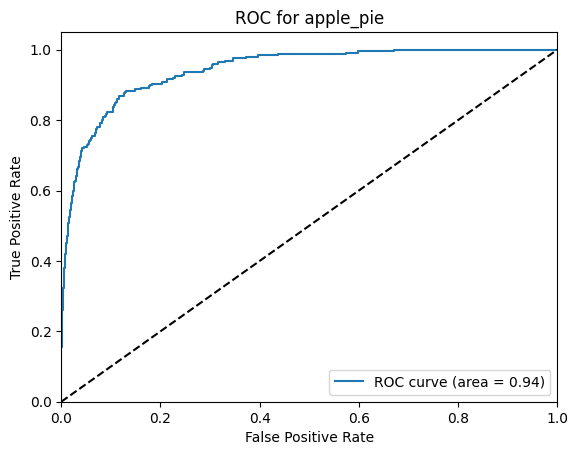

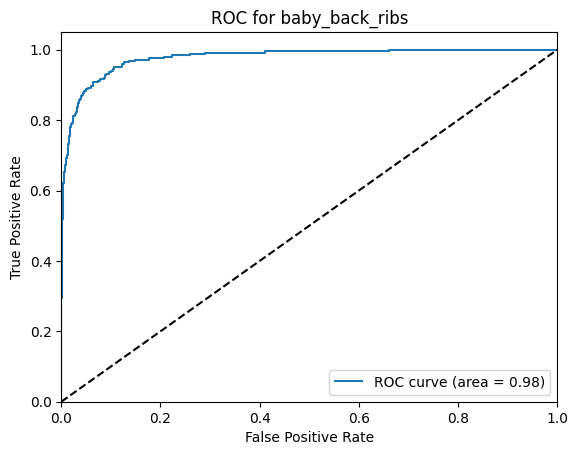

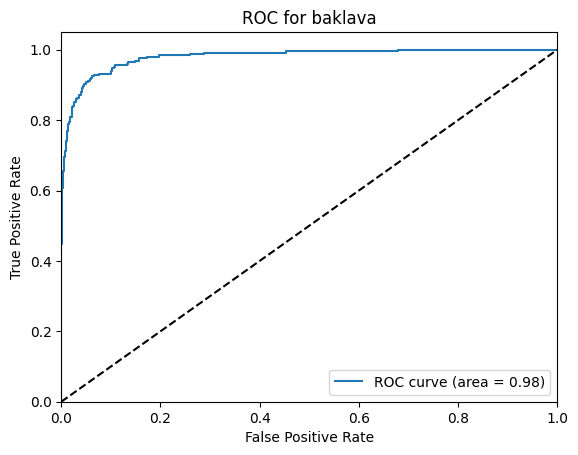

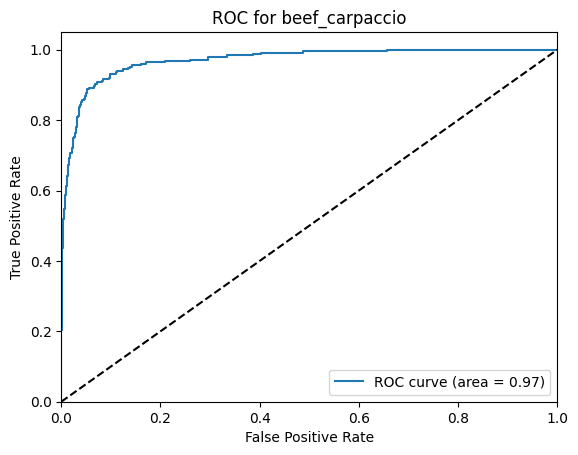

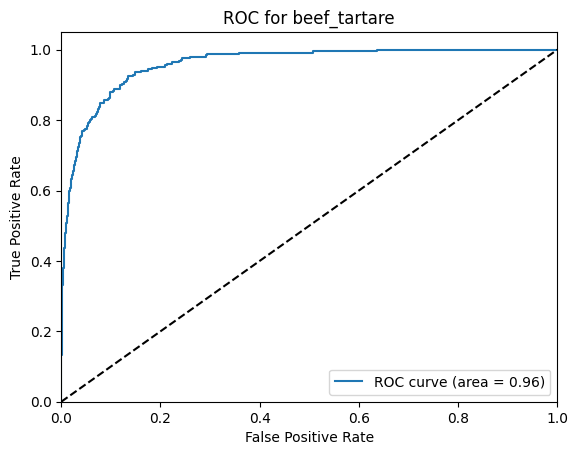

...

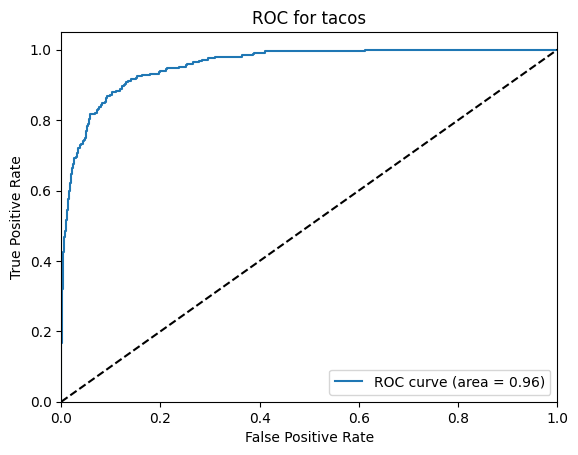

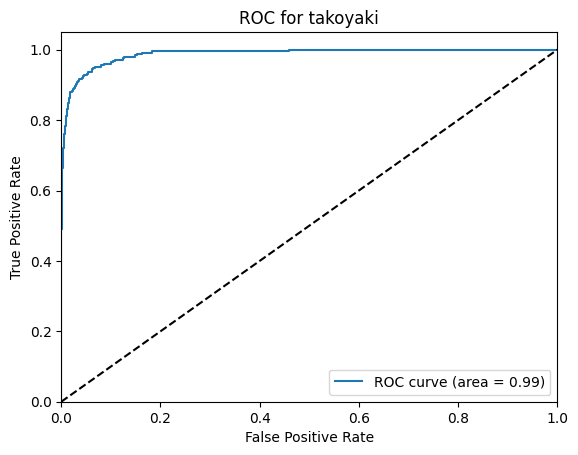

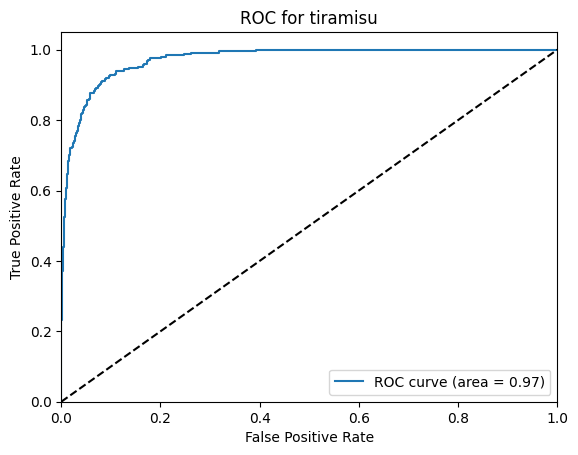

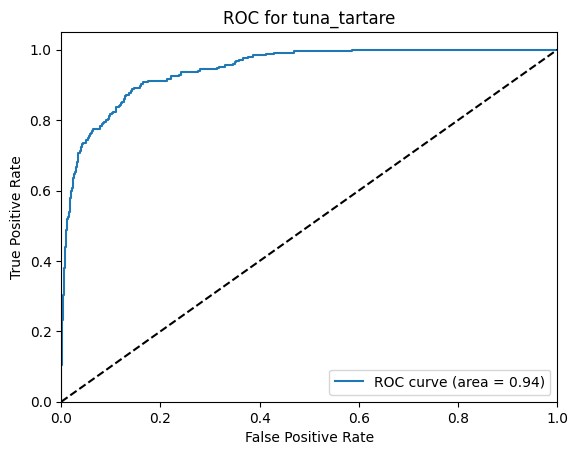

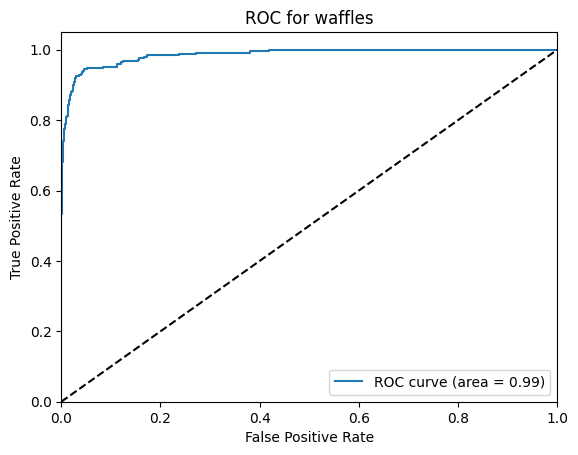

In [9]:
# Your file path here：
model_path = 'InceptionV3_model_full_v3.hdf5'
test_dir = 'food-101/test'
evaluate_model(model_path, test_dir)

## Fine-tune version 4

- unfreezed the top 249 layers of Inception V3 model
- added a BatchNormalization layer, two dense layer and a dropout layer on top of other layers （replace GlobalAveragePooling2D layer with BatchNormalization layer）
- Adam optimizer with larning rate of 0.0001 
- early stop based on loss rate

The fine-rune focus on the performance of transfer learning on Food-101 dataset

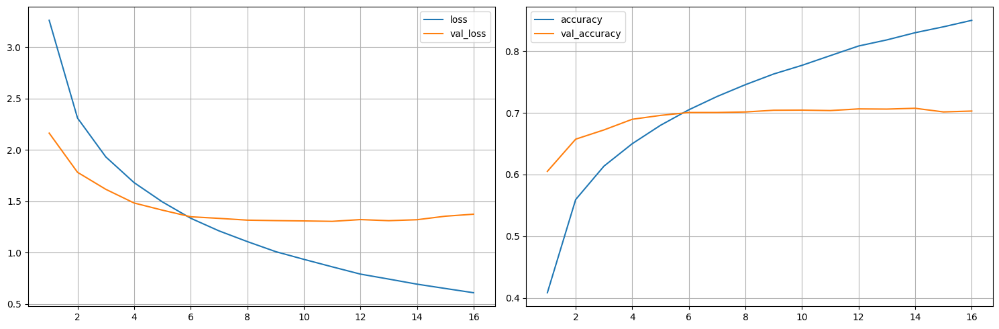

592/592 [==============================] - 1746s 3s/step - loss: 0.6094 - accuracy: 0.8501 - val_loss: 1.3742 - val_accuracy: 0.7029


In [10]:
inceptionV3_tune = InceptionV3(weights='imagenet', include_top=False,pooling='avg')

for layer in inceptionV3_tune.layers[:249]:
    layer.trainable = False
for layer in inceptionV3_tune.layers[249:]:
    layer.trainable = True

x = inceptionV3_tune.output
x = BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001)(x)
x = Dense(2048, activation='relu')(x)
x = Dense(2048, activation='relu')(x)
x = Dropout(0.2)(x)

predictions = Dense(num_classes, kernel_regularizer=regularizers.l2(0.005), activation='softmax')(x)

model = Model(inputs = inceptionV3_tune.input, outputs = predictions)
model.compile(optimizer = Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

checkpointer1 = ModelCheckpoint(filepath='InceptionV3_model_full_v4.hdf5', verbose=1, save_best_only=True)

stop_early = EarlyStopping(monitor='val_loss', patience=5)

history_inceptionV3 = model.fit(train_data,
                    validation_data = val_data,
                    epochs = 50,
                    verbose = 1,
                    callbacks=[checkpointer1, stop_early,PlotLearning()])

The evaluation for Inception V3 fine-tune version 4:
1. As the number of epochs increases, the training loss continues to decrease and begins to plateau after around 10 epochs, suggesting that the model is starting to converge
2. The validation loss decreases alongside the training loss but begins to plateau and diverge slightly after around 6 epochs. This could be an early sign of overfitting.
3. The validation accuracy shows little improvement after about 6 epochs and even a slight decline or fluctuation towards the end. It indicates that the model's ability to generalize is not improving significantly after a certain point, which could be a concern for overfitting as well.

The evaluation metrics and the roc value are shown below

Found 25250 images belonging to 101 classes.
790/790 [==============================] - 299s 377ms/step
Classification Report:
                         precision    recall  f1-score   support

              apple_pie       0.43      0.57      0.49       250
         baby_back_ribs       0.79      0.72      0.75       250
                baklava       0.68      0.82      0.75       250
         beef_carpaccio       0.69      0.64      0.66       250
           beef_tartare       0.61      0.49      0.54       250
             beet_salad       0.55      0.46      0.50       250
               beignets       0.87      0.83      0.85       250
               bibimbap       0.82      0.88      0.85       250
          bread_pudding       0.44      0.52      0.47       250
      breakfast_burrito       0.64      0.65      0.64       250
             bruschetta       0.65      0.47      0.55       250
           caesar_salad       0.64      0.72      0.68       250
                cannoli    

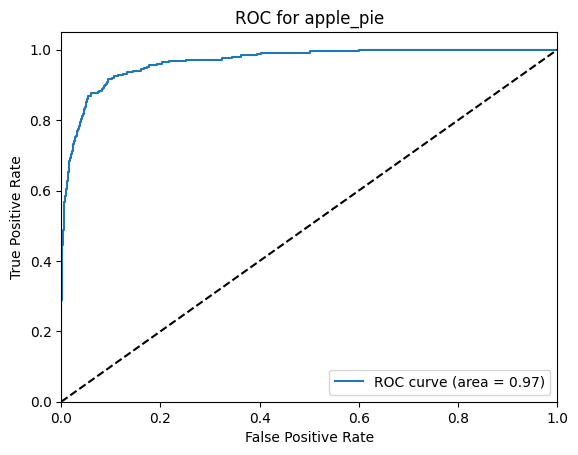

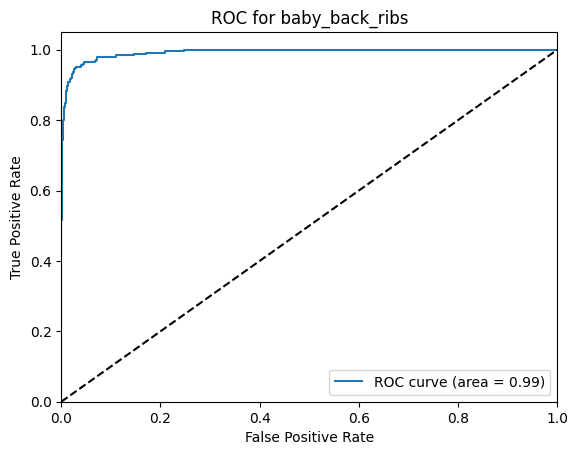

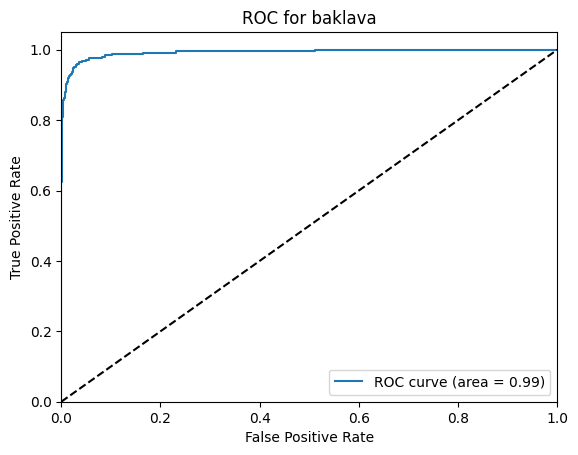

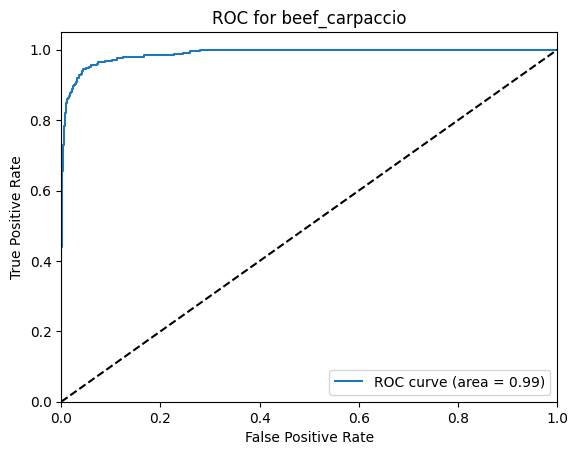

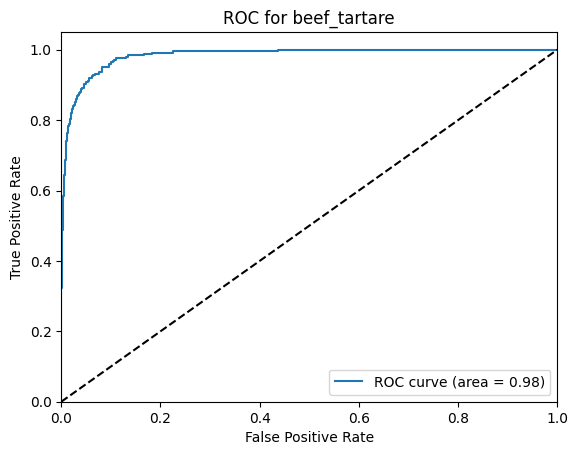

...

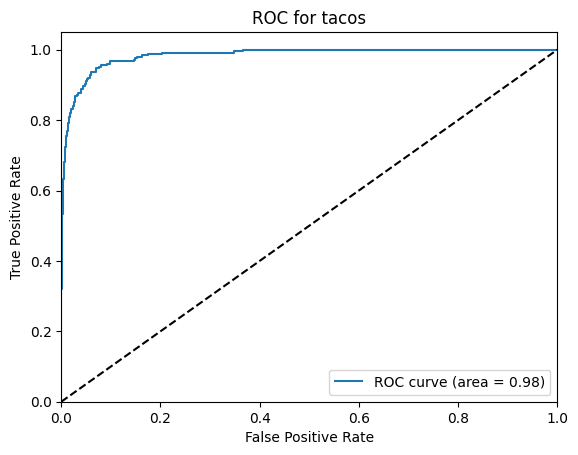

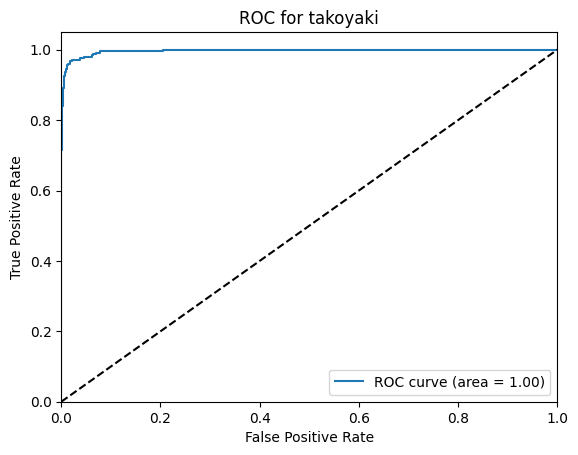

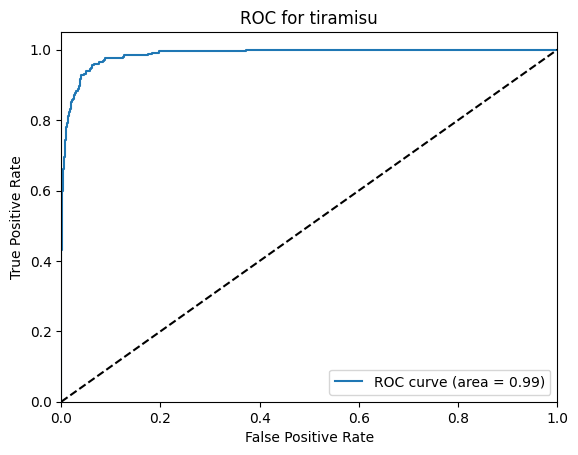

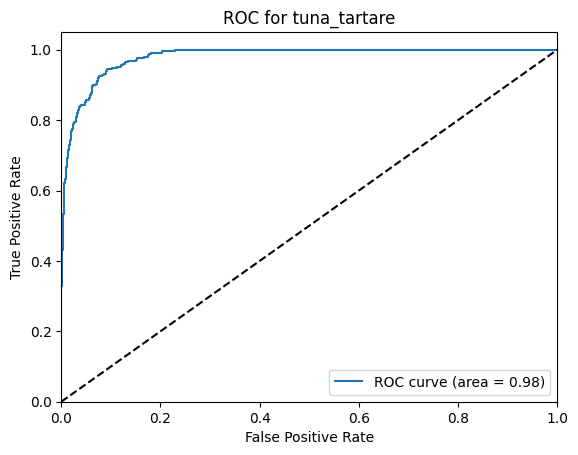

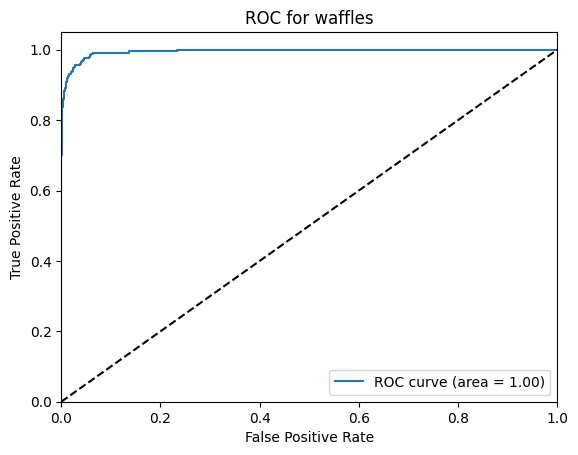

In [11]:
# Your file path here：
model_path = 'InceptionV3_model_full_v4.hdf5'
test_dir = 'food-101/test'
evaluate_model(model_path, test_dir)

In [5]:
batch_size = 32
channels = 3
num_classes = 101

## Build an ImageDataGenerator instance for data Augmentation
train_datagen = ImageDataGenerator(
        rotation_range=40,
        width_shift_range=0.2,
        height_shift_range=0.2,
        rescale=1. / 255,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest')


test_datagen = ImageDataGenerator(rescale=1. / 255)

train_data_dir = 'food-101/train'
validation_data_dir = 'food-101/test'

train_data = train_datagen.flow_from_directory(
    train_data_dir,
    target_size = img_size,
    batch_size = batch_size,
    class_mode = 'categorical')

val_data = test_datagen.flow_from_directory(
    validation_data_dir,
    target_size = img_size,
    batch_size = batch_size,
    class_mode='categorical')

Found 75750 images belonging to 101 classes.
Found 25250 images belonging to 101 classes.


## Fine-tune version 5: 

- unfreezed the top 249 layers of Inception V3 model
- added a BatchNormalization layer, a dropout layer, two dense layer and a dropout layer on top of other layers （add a new dropout layer after the BatchNormalization layer）
- Adam optimizer with larning rate of 0.001 (previous 0.0001)
- early stop based on loss rate

The fine-rune focus on the performance of transfer learning on Food-101 dataset

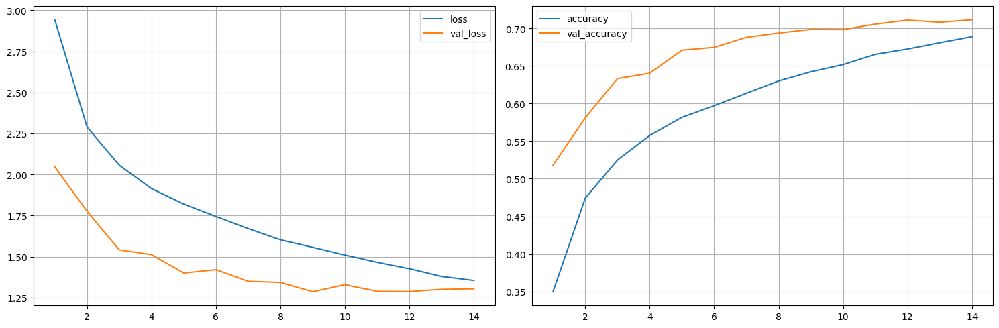

2368/2368 [==============================] - 1750s 739ms/step - loss: 1.3552 - accuracy: 0.6889 - val_loss: 1.3045 - val_accuracy: 0.7114


In [8]:
inceptionV3_tune = InceptionV3(weights='imagenet', include_top=False,pooling='avg')

#Unfreeze the top 2 layers
for layer in inceptionV3_tune.layers[:249]:
    layer.trainable = False
for layer in inceptionV3_tune.layers[249:]:
    layer.trainable = True

x = inceptionV3_tune.output
x = BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001)(x)
x = Dropout(0.2)(x)
x = Dense(2048, activation='relu')(x)
x = Dense(2048, activation='relu')(x)
x = Dropout(0.2)(x)

predictions = Dense(num_classes, kernel_regularizer=regularizers.l2(0.005), activation='softmax')(x)

model = Model(inputs = inceptionV3_tune.input, outputs = predictions)
model.compile(optimizer = Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

checkpointer1 = ModelCheckpoint(filepath='InceptionV3_model_full_v5.hdf5', verbose=1, save_best_only=True)

stop_early = EarlyStopping(monitor='val_loss', patience=5)

history_inceptionV3 = model.fit(train_data,
                    validation_data = val_data,
                    epochs = 100,
                    verbose = 1,
                    callbacks=[checkpointer1, stop_early,PlotLearning()])

The plot of loss rate illustrate that the loss curves for both train and test set does not converge. Also, the plot of accuracy rate illustrate that the accuract curves for both train and test set does not converge. Therefore, it shows that valdiation accuracy and train accuracy has not reached its peak and it will continue to increase with more epoches. 

## Fine-tune version 6: 

- unfreezed the top 249 layers of Inception V3 model
- added a BatchNormalization layer, a dropout layer, two dense layer and a dropout layer on top of other layers （
- Adam optimizer with larning rate of 0.001 
- early stop based on validation accuracy (previous on loss rate)

The fine-rune focus on the performance of transfer learning on Food-101 dataset

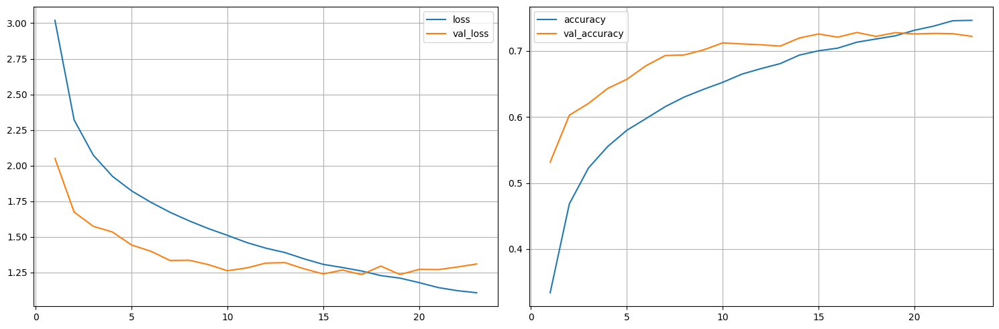

2368/2368 [==============================] - 1823s 770ms/step - loss: 1.1087 - accuracy: 0.7464 - val_loss: 1.3105 - val_accuracy: 0.7222
Epoch 24/100
1368/2368 [================>.............] - ETA: 10:58 - loss: 1.0597 - accuracy: 0.7604

: 

In [6]:
inceptionV3_tune = InceptionV3(weights='imagenet', include_top=False,pooling='avg')

#Unfreeze the top 2 layers
for layer in inceptionV3_tune.layers[:249]:
    layer.trainable = False
for layer in inceptionV3_tune.layers[249:]:
    layer.trainable = True

x = inceptionV3_tune.output
x = BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001)(x)
x = Dropout(0.2)(x)
x = Dense(2048, activation='relu')(x)
x = Dense(2048, activation='relu')(x)
x = Dropout(0.2)(x)

predictions = Dense(num_classes, kernel_regularizer=regularizers.l2(0.005), activation='softmax')(x)

model = Model(inputs = inceptionV3_tune.input, outputs = predictions)
model.compile(optimizer = Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

checkpointer1 = ModelCheckpoint(filepath='InceptionV3_model_full_v5.hdf5', verbose=1, save_best_only=True)

stop_early = EarlyStopping(monitor='val_accuracy', patience=10)

history_inceptionV3 = model.fit(train_data,
                    validation_data = val_data,
                    epochs = 100,
                    verbose = 1,
                    callbacks=[checkpointer1, stop_early,PlotLearning()])

The model appears to learn effectively, but caution is needed to prevent overfitting, which seems to start after a certain number of epochs. Taking steps to mitigate this early can lead to better model generalization

In [8]:
from keras.callbacks import LearningRateScheduler
import math
def scheduler(epoch):
    initial_lr = 0.005
    decay_rate = 0.95 # decrease 5% per epoch
    lr = initial_lr * math.pow(decay_rate, epoch)
    return lr
  
lrScheduler = tf.keras.callbacks.LearningRateScheduler(scheduler,verbose=1)

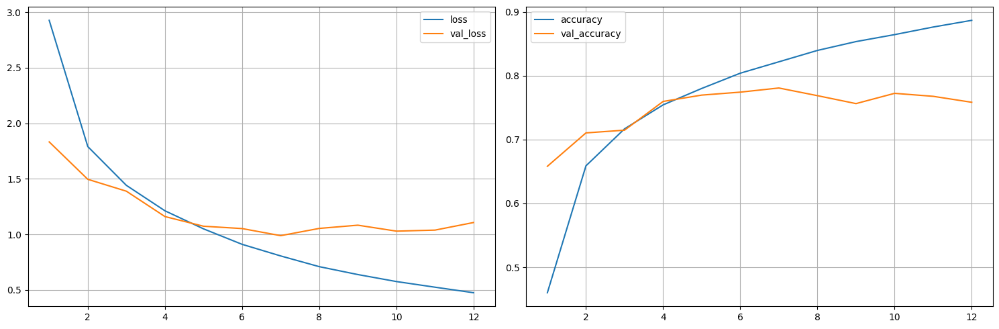

592/592 [==============================] - 3908s 7s/step - loss: 0.4748 - accuracy: 0.8868 - val_loss: 1.1067 - val_accuracy: 0.7584


In [6]:
inceptionV3_tune = InceptionV3(weights='imagenet', include_top=False)


x = inceptionV3_tune.output
x = GlobalAveragePooling2D()(x)
x = Dense(2048, activation='relu') (x)
x = Dense(2048, activation='relu')(x)
x = Dropout(0.2)(x)

predictions = Dense(num_classes, kernel_regularizer=regularizers.l2(0.005), activation='softmax')(x)

model = Model(inputs = inceptionV3_tune.input, outputs = predictions)
model.compile(optimizer = Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

checkpointer1 = ModelCheckpoint(filepath='InceptionV3_model_full_unfreezed.hdf5', verbose=1, save_best_only=True)

stop_early = EarlyStopping(monitor='val_accuracy', patience=5)

history_inceptionV3 = model.fit(train_data,
                    validation_data = val_data,
                    epochs = 100,
                    verbose = 1,
                    callbacks=[checkpointer1, stop_early,PlotLearning()])


Found 25250 images belonging to 101 classes.
790/790 [==============================] - 323s 407ms/step
Classification Report:
                         precision    recall  f1-score   support

              apple_pie       0.56      0.63      0.59       250
         baby_back_ribs       0.75      0.82      0.78       250
                baklava       0.61      0.94      0.74       250
         beef_carpaccio       0.62      0.94      0.75       250
           beef_tartare       0.80      0.70      0.75       250
             beet_salad       0.69      0.62      0.65       250
               beignets       0.89      0.79      0.84       250
               bibimbap       0.97      0.81      0.88       250
          bread_pudding       0.73      0.51      0.60       250
      breakfast_burrito       0.77      0.71      0.74       250
             bruschetta       0.68      0.70      0.69       250
           caesar_salad       0.78      0.86      0.82       250
                cannoli    

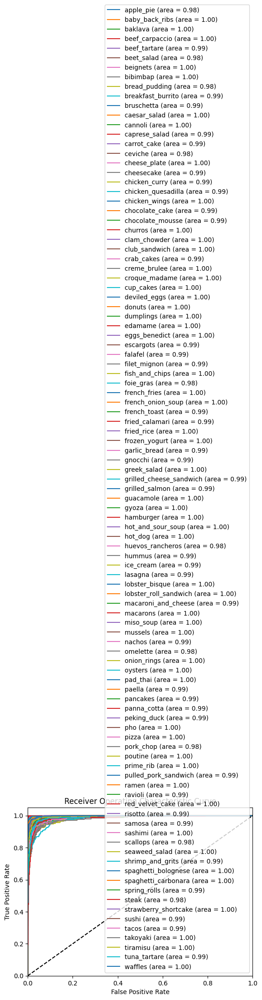

In [8]:
model_path = 'InceptionV3_model_full_unfreezed.hdf5'
test_dir = 'food-101/test'
evaluate_model(model_path, test_dir)

In [8]:

accuracy = accuracy_score(true_labels, predictions)
precision = precision_score(true_labels, predictions, average='macro')  # also 'micro', 'weighted', or None
recall = recall_score(true_labels, predictions, average='macro')
f1 = f1_score(true_labels, predictions, average='macro')
    
# Create a DataFrame to store the metrics
data = [['Accuracy', accuracy],
        ['Precision', precision],
        ['Recall', recall],
        ['F1', f1]]

# Print the metrics table
print(accuracy)
print(precision)
print(recall)
print(f1)

0.7807920792079208
0.7920171535488523
0.7807920792079208
0.7806442628065431
